In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        os.path.join(dirname, filename)

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [3]:
import os
import numpy as np
from PIL import Image
import cv2

# Define the paths for SAR and optical images from the "urban" section
image_path_sar = '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/urban/s2'
image_path_sar1 = '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/agri/s2'
image_path_sar2 = '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/grassland/s2'
image_path_sar3= '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/barrenland/s2'

import os
import shutil

# Define the paths for SAR images from different classes
paths = {
    "urban": '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/urban/s2',
    "agri": '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/agri/s2',
    "grassland": '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/grassland/s2',
    "barrenland": '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/barrenland/s2'
}

# Create a new folder to store the combined dataset
combined_dataset_path = '/kaggle/working/SAR_Segment'
if not os.path.exists(combined_dataset_path):
    os.makedirs(combined_dataset_path)

# Create subdirectories for each class
for label in paths.keys():
    class_path = os.path.join(combined_dataset_path, label)
    if not os.path.exists(class_path):
        os.makedirs(class_path)

# Copy the images to the respective folders in the combined dataset
for label, image_path in paths.items():
    for image_name in os.listdir(image_path):
        src = os.path.join(image_path, image_name)
        dst = os.path.join(combined_dataset_path, label, image_name)
        shutil.copy(src, dst)

print("Dataset successfully combined into SAR_Segment with 4 classes.")




Dataset successfully combined into SAR_Segment with 4 classes.


In [4]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define image size and batch size
IMG_SIZE = (224, 224)  # You can adjust this size based on your needs
BATCH_SIZE = 32

# Set the path to the combined dataset
dataset_path = '/kaggle/working/SAR_Segment'

# Use ImageDataGenerator to load images from directories
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)  # Rescale the pixel values between 0 and 1

# Create training and validation datasets
train_data = datagen.flow_from_directory(
    dataset_path,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',  # Since we have multiple classes
    subset='training'  # Use the training data split
)

val_data = datagen.flow_from_directory(
    dataset_path,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',  # Since we have multiple classes
    subset='validation'  # Use the validation data split
)

# Print class indices
print(train_data.class_indices)  # This will print the mapping of class names to indices


Found 12800 images belonging to 4 classes.
Found 3200 images belonging to 4 classes.
{'agri': 0, 'barrenland': 1, 'grassland': 2, 'urban': 3}


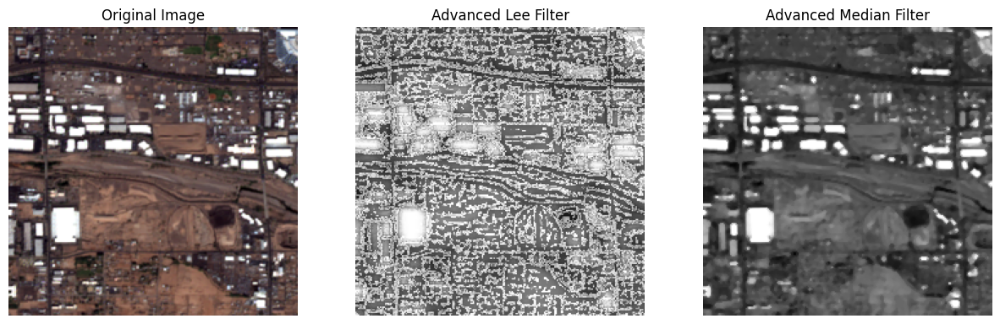

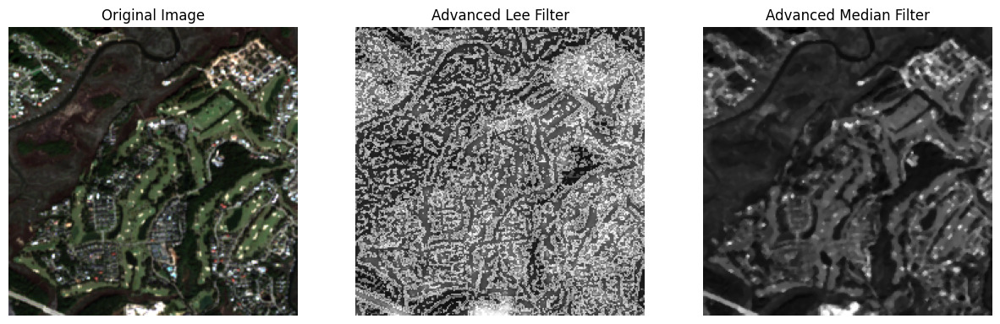

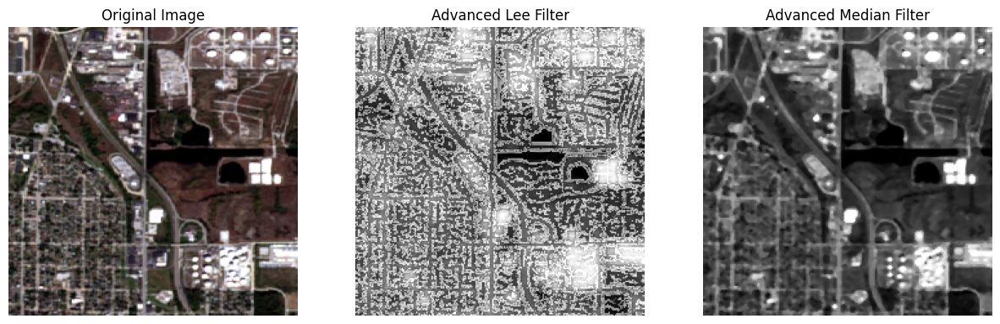

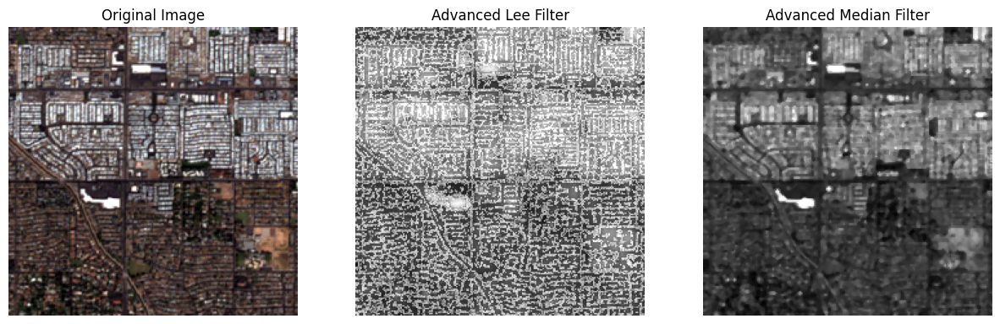

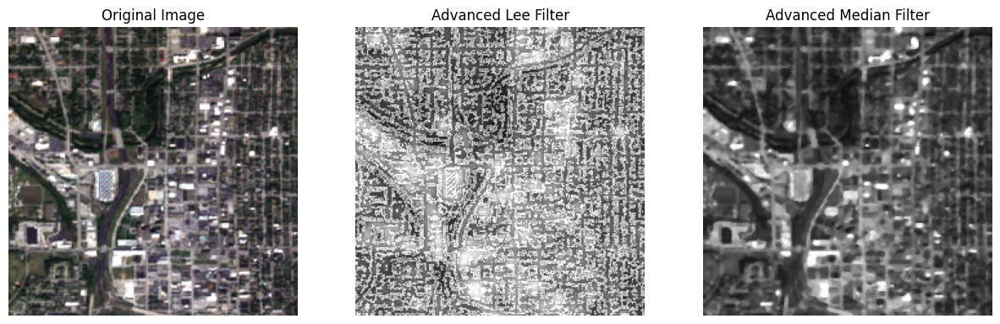

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

def advanced_lee_filter(img, size=7):
    # Convert to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    mean_img = cv2.blur(gray_img, (size, size))
    mean_square_img = cv2.blur(gray_img**2, (size, size))
    variance_img = mean_square_img - mean_img**2

    overall_variance = np.mean(variance_img)
    weights = np.clip(variance_img / (variance_img + overall_variance), 0, 1)

    advanced_lee_filtered = mean_img + weights * (gray_img - mean_img)
    advanced_lee_filtered = np.clip(advanced_lee_filtered, 0, 255).astype(np.uint8)
    
    return cv2.cvtColor(advanced_lee_filtered, cv2.COLOR_GRAY2RGB)

def advanced_median_filter(img, size=3):
    # Apply advanced median filter with adaptive neighborhood
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Initialize an empty image to store the filtered result
    filtered_img = np.zeros_like(gray_img)

    # Apply the median filter with an adaptive neighborhood
    padded_img = np.pad(gray_img, size // 2, mode='reflect')
    for i in range(gray_img.shape[0]):
        for j in range(gray_img.shape[1]):
            local_window = padded_img[i:i+size, j:j+size]
            median_val = np.median(local_window)
            filtered_img[i, j] = median_val

    return cv2.cvtColor(filtered_img, cv2.COLOR_GRAY2RGB)

# Apply filters and display 5 images before and after filtering
sample_images = 5
processed_count = 0

for label in os.listdir(dataset_path):
    label_path = os.path.join(dataset_path, label)
    for img_name in os.listdir(label_path):
        if processed_count >= sample_images:
            break

        # Load image
        img_path = os.path.join(label_path, img_name)
        img = Image.open(img_path)
        img = img.resize(IMG_SIZE)
        img = np.array(img)

        # Apply filters
        advanced_lee_filtered_img = advanced_lee_filter(img)
        advanced_median_filtered_img = advanced_median_filter(img)

        # Display original and filtered images
        fig, ax = plt.subplots(1, 3, figsize=(15, 5))
        ax[0].imshow(img)
        ax[0].set_title("Original Image")
        ax[1].imshow(advanced_lee_filtered_img)
        ax[1].set_title("Advanced Lee Filter")
        ax[2].imshow(advanced_median_filtered_img)
        ax[2].set_title("Advanced Median Filter")
        for a in ax:
            a.axis('off')
        plt.show()

        processed_count += 1


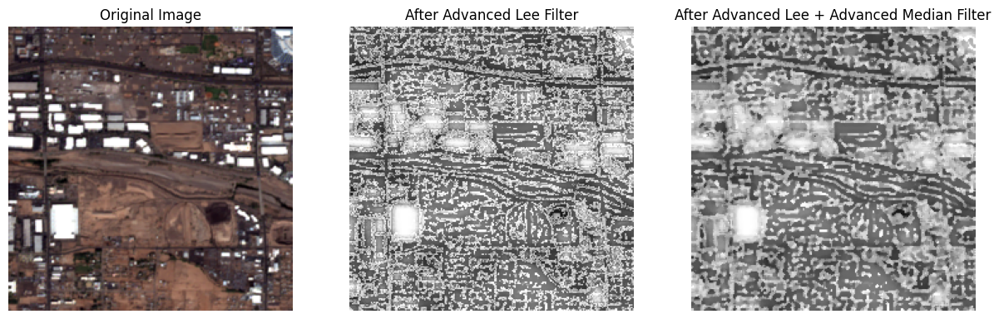

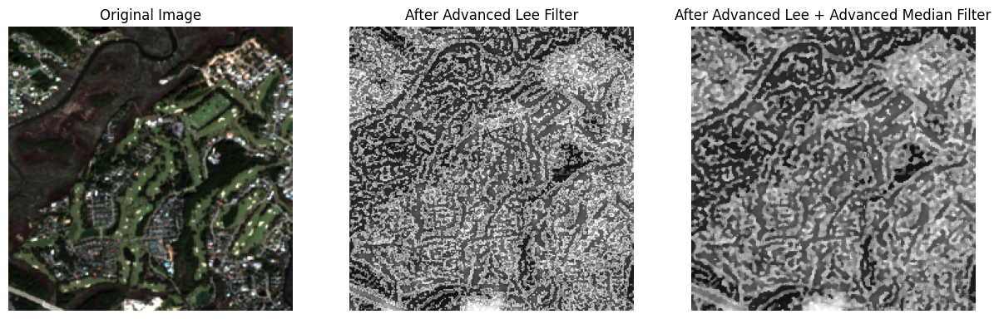

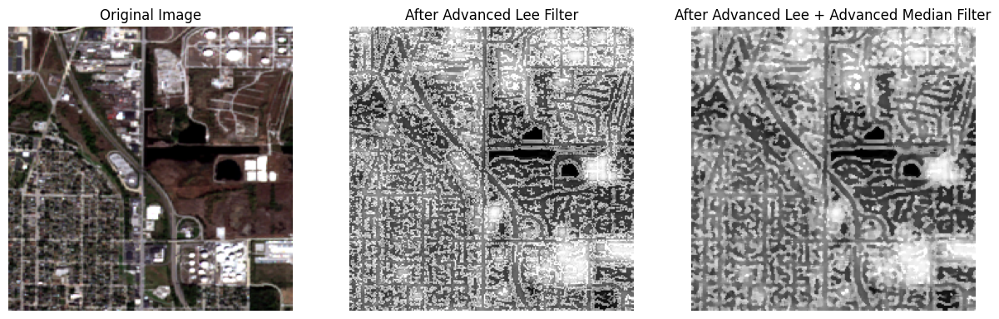

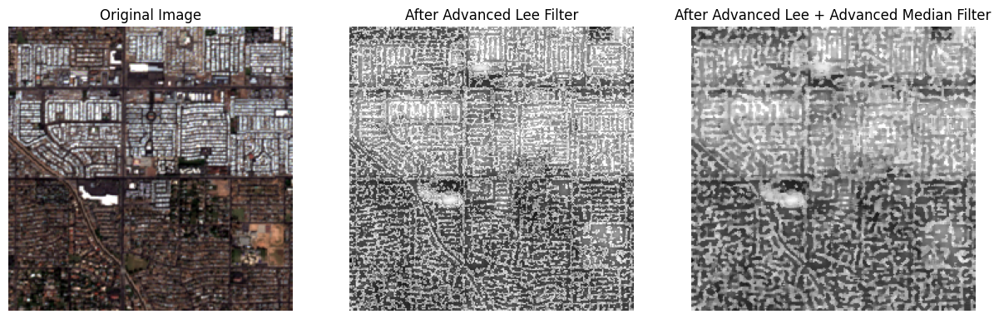

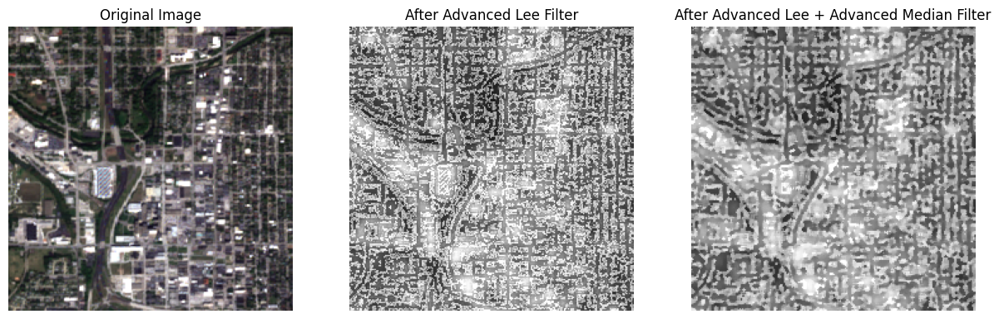

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

def advanced_lee_filter(img, size=7):
    # Convert to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    mean_img = cv2.blur(gray_img, (size, size))
    mean_square_img = cv2.blur(gray_img**2, (size, size))
    variance_img = mean_square_img - mean_img**2

    overall_variance = np.mean(variance_img)
    weights = np.clip(variance_img / (variance_img + overall_variance), 0, 1)

    advanced_lee_filtered = mean_img + weights * (gray_img - mean_img)
    advanced_lee_filtered = np.clip(advanced_lee_filtered, 0, 255).astype(np.uint8)
    
    return cv2.cvtColor(advanced_lee_filtered, cv2.COLOR_GRAY2RGB)

def advanced_median_filter(img, size=3):
    # Apply advanced median filter with adaptive neighborhood
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Initialize an empty image to store the filtered result
    filtered_img = np.zeros_like(gray_img)

    # Apply the median filter with an adaptive neighborhood
    padded_img = np.pad(gray_img, size // 2, mode='reflect')
    for i in range(gray_img.shape[0]):
        for j in range(gray_img.shape[1]):
            local_window = padded_img[i:i+size, j:j+size]
            median_val = np.median(local_window)
            filtered_img[i, j] = median_val

    return cv2.cvtColor(filtered_img, cv2.COLOR_GRAY2RGB)

# Apply both filters and display 5 images before and after filtering
sample_images = 5
processed_count = 0

for label in os.listdir(dataset_path):
    label_path = os.path.join(dataset_path, label)
    for img_name in os.listdir(label_path):
        if processed_count >= sample_images:
            break

        # Load image
        img_path = os.path.join(label_path, img_name)
        img = Image.open(img_path)
        img = img.resize(IMG_SIZE)
        img = np.array(img)

        # Apply advanced Lee filter
        lee_filtered_img = advanced_lee_filter(img)
        
        # Apply advanced median filter on the result of advanced Lee filter
        combined_filtered_img = advanced_median_filter(lee_filtered_img)

        # Display original and filtered images
        fig, ax = plt.subplots(1, 3, figsize=(15, 5))
        ax[0].imshow(img)
        ax[0].set_title("Original Image")
        ax[1].imshow(lee_filtered_img)
        ax[1].set_title("After Advanced Lee Filter")
        ax[2].imshow(combined_filtered_img)
        ax[2].set_title("After Advanced Lee + Advanced Median Filter")
        for a in ax:
            a.axis('off')
        plt.show()

        processed_count += 1


In [7]:
import cv2
import numpy as np
import os
import random
from tqdm import tqdm
from PIL import Image

# Define the paths for input and output directories
input_dataset_path = '/kaggle/working/SAR_Segment'
output_dataset_path = '/kaggle/working/Filtered_SAR_Segment'

# Ensure the output directory exists, creating subdirectories for each class
if not os.path.exists(output_dataset_path):
    os.makedirs(output_dataset_path)

for label in os.listdir(input_dataset_path):
    label_input_path = os.path.join(input_dataset_path, label)
    label_output_path = os.path.join(output_dataset_path, label)
    
    if not os.path.exists(label_output_path):
        os.makedirs(label_output_path)

def advanced_lee_filter(img, size=7):
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    mean_img = cv2.blur(gray_img, (size, size))
    mean_square_img = cv2.blur(gray_img**2, (size, size))
    variance_img = mean_square_img - mean_img**2
    overall_variance = np.mean(variance_img)
    weights = np.clip(variance_img / (variance_img + overall_variance), 0, 1)
    advanced_lee_filtered = mean_img + weights * (gray_img - mean_img)
    return cv2.cvtColor(np.clip(advanced_lee_filtered, 0, 255).astype(np.uint8), cv2.COLOR_GRAY2RGB)

def advanced_median_filter(img, size=3):
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    filtered_img = np.zeros_like(gray_img)
    padded_img = np.pad(gray_img, size // 2, mode='reflect')
    for i in range(gray_img.shape[0]):
        for j in range(gray_img.shape[1]):
            local_window = padded_img[i:i+size, j:j+size]
            filtered_img[i, j] = np.median(local_window)
    return cv2.cvtColor(filtered_img, cv2.COLOR_GRAY2RGB)

# Process only 20% of images in each class with a progress bar
for label in os.listdir(input_dataset_path):
    label_input_path = os.path.join(input_dataset_path, label)
    label_output_path = os.path.join(output_dataset_path, label)
    
    if not os.path.exists(label_output_path):
        os.makedirs(label_output_path)
    
    all_images = os.listdir(label_input_path)
    num_images_to_process = int(0.1 * len(all_images))
    sampled_images = random.sample(all_images, num_images_to_process)
    
    # Progress bar for each label
    print(f"Processing {label} images...")
    for img_name in tqdm(sampled_images, desc=f"Filtering {label}", unit="image"):
        img_path = os.path.join(label_input_path, img_name)
        img = Image.open(img_path).resize(IMG_SIZE)
        img = np.array(img)

        # Apply filters
        lee_filtered_img = advanced_lee_filter(img)
        combined_filtered_img = advanced_median_filter(lee_filtered_img)

        # Save filtered image
        output_img = Image.fromarray(combined_filtered_img)
        output_img.save(os.path.join(label_output_path, img_name))

print("Filtering completed for 10% of images in each class.")


Processing urban images...


Filtering urban: 100%|██████████| 400/400 [05:06<00:00,  1.30image/s]


Processing grassland images...


Filtering grassland: 100%|██████████| 400/400 [05:04<00:00,  1.31image/s]


Processing agri images...


Filtering agri: 100%|██████████| 400/400 [05:04<00:00,  1.31image/s]


Processing barrenland images...


Filtering barrenland: 100%|██████████| 400/400 [05:06<00:00,  1.31image/s]

Filtering completed for 10% of images in each class.


In [8]:
pip install --upgrade pip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 19.6 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: pip
    Found existing installation: pip 23.0.1
    Uninstalling pip-23.0.1:
      Successfully uninstalled pip-23.0.1
Note: you may need to restart the kernel to use updated packages.


In [9]:
!pip install git+https://github.com/scikit-fuzzy/scikit-fuzzy


  Cloning https://github.com/scikit-fuzzy/scikit-fuzzy to /tmp/pip-req-build-evtvqwj_
  Running command git clone --filter=blob:none --quiet https://github.com/scikit-fuzzy/scikit-fuzzy /tmp/pip-req-build-evtvqwj_
  Resolved https://github.com/scikit-fuzzy/scikit-fuzzy to commit be7e344f3ce65845e39922aa5fc1af7412d01944
  Running command git submodule update --init --recursive -q
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-fuzzy: filename=scikit_fuzzy-0.5.0-py2.py3-none-any.whl size=920818 sha256=4552f349bea372cdca425bf254bd700ff771eb1926117625f84d6f981d8241c6
  Stored in directory: /tmp/pip-ephem-wheel-cache-843bo3nj/wheels/82/d5/72/3e485c7a9b1a08d3b9f5d416c9990d987dc5138c319917a9db
Successfully built scikit-fuzzy


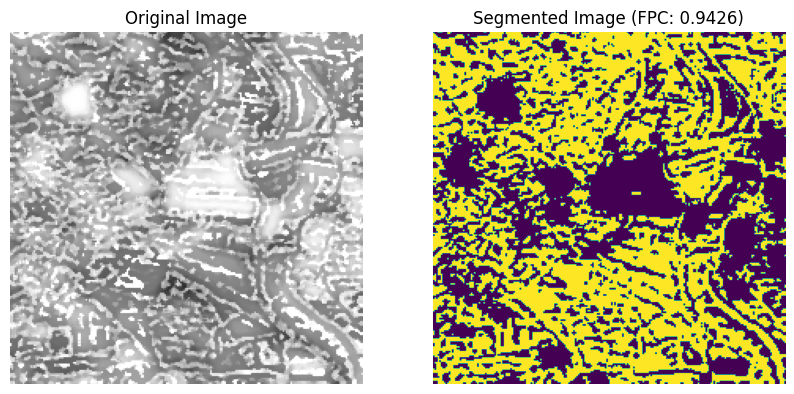

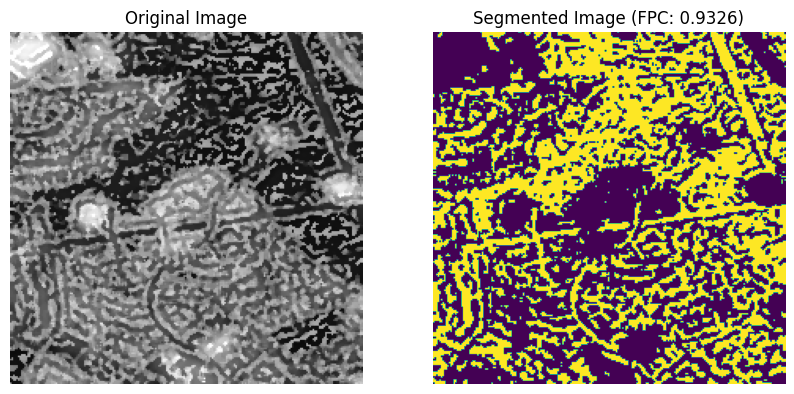

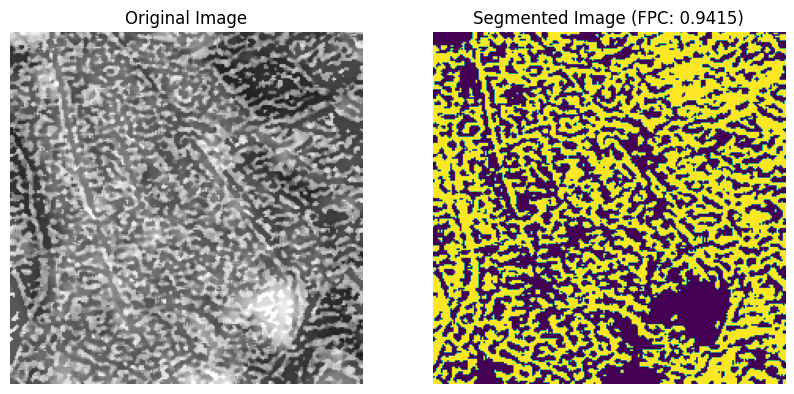

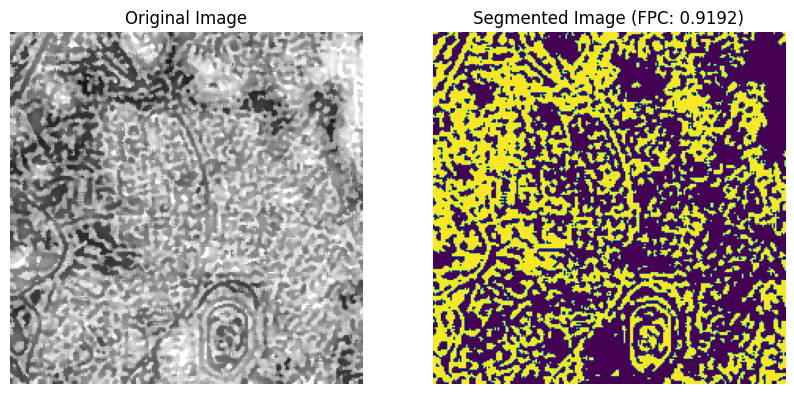

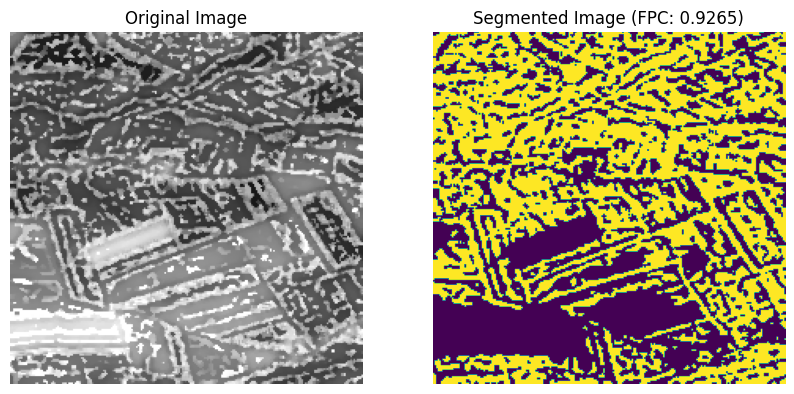

Fuzzy Partition Coefficients for the segmented images:
Image 1: FPC = 0.9426
Image 2: FPC = 0.9326
Image 3: FPC = 0.9415
Image 4: FPC = 0.9192
Image 5: FPC = 0.9265


In [10]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import skfuzzy as fuzz
from skfuzzy.cluster import cmeans
from sklearn.model_selection import train_test_split

# Define paths
filtered_dataset_path = '/kaggle/working/Filtered_SAR_Segment'

# Function to load images and resize them for processing
def load_images(dataset_path, sample_percentage=0.1, img_size=(224, 224)):
    images = []
    labels = []
    for label in os.listdir(dataset_path):
        label_path = os.path.join(dataset_path, label)
        for img_name in os.listdir(label_path):
            img_path = os.path.join(label_path, img_name)
            img = Image.open(img_path)
            img = img.resize(img_size)
            images.append(np.array(img))
            labels.append(label)
    # Sample 10% of the images
    _, sampled_images, _, _ = train_test_split(images, labels, test_size=sample_percentage, random_state=42)
    return sampled_images

# Load 10% of the dataset
sampled_images = load_images(filtered_dataset_path, sample_percentage=0.1)

# Function to apply Fuzzy C-means and calculate FPC
def fuzzy_cmeans_clustering(image, num_clusters=2):
    # Reshape image to a 2D array (pixels x channels)
    img_2d = image.reshape(-1, 3).T  # Transpose for skfuzzy

    # Apply Fuzzy C-means
    cntr, u, _, _, _, _, fpc = cmeans(
        img_2d, c=num_clusters, m=1.5, error=0.005, maxiter=100, init=None
    )
    
    # Get the hard clustering result by finding the max probability for each pixel
    cluster_membership = np.argmax(u, axis=0)
    segmented_image = cluster_membership.reshape(image.shape[:2])

    return segmented_image, fpc

# Apply Fuzzy C-means on the first 5 images and display results
fpc_scores = []
for i, image in enumerate(sampled_images[:5]):
    segmented_image, fpc = fuzzy_cmeans_clustering(image)
    fpc_scores.append(fpc)
    
    # Display original and segmented image
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(image)
    ax[0].set_title("Original Image")
    ax[0].axis("off")
    
    ax[1].imshow(segmented_image, cmap="viridis")
    ax[1].set_title(f"Segmented Image (FPC: {fpc:.4f})")
    ax[1].axis("off")
    plt.show()

# Print the FPC scores for the processed images
print("Fuzzy Partition Coefficients for the segmented images:")
for i, fpc in enumerate(fpc_scores, 1):
    print(f"Image {i}: FPC = {fpc:.4f}")


In [11]:
import os
import numpy as np
from PIL import Image
import skfuzzy as fuzz
from skfuzzy.cluster import cmeans
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Define paths for input (filtered images) and output (segmented images)
filtered_dataset_path = '/kaggle/working/Filtered_SAR_Segment'
segmented_dataset_path = '/kaggle/working/Segmented_SAR_Segment'

# Ensure the output directory exists, creating subdirectories for each class
if not os.path.exists(segmented_dataset_path):
    os.makedirs(segmented_dataset_path)

for label in os.listdir(filtered_dataset_path):
    label_output_path = os.path.join(segmented_dataset_path, label)
    if not os.path.exists(label_output_path):
        os.makedirs(label_output_path)

# Function to load images and resize them for processing
def load_images(dataset_path, sample_percentage=0.5, img_size=(224, 224)):
    images = []
    labels = []
    for label in os.listdir(dataset_path):
        label_path = os.path.join(dataset_path, label)
        for img_name in os.listdir(label_path):
            img_path = os.path.join(label_path, img_name)
            img = Image.open(img_path)
            img = img.resize(img_size)
            images.append(np.array(img))
            labels.append((label, img_name))
    # Sample 50% of the images
    _, sampled_images, _, sampled_labels = train_test_split(images, labels, test_size=sample_percentage, random_state=42)
    return sampled_images, sampled_labels

# Load 50% of the dataset
sampled_images, sampled_labels = load_images(filtered_dataset_path, sample_percentage=0.5)

# Function to apply Fuzzy C-means and save segmented images
def fuzzy_cmeans_clustering(image, num_clusters=2):
    # Reshape image to a 2D array (pixels x channels)
    img_2d = image.reshape(-1, 3).T  # Transpose for skfuzzy

    # Apply Fuzzy C-means
    cntr, u, _, _, _, _, _ = cmeans(
        img_2d, c=num_clusters, m=1.5, error=0.005, maxiter=1000, init=None
    )
    
    # Get the hard clustering result by finding the max probability for each pixel
    cluster_membership = np.argmax(u, axis=0)
    segmented_image = cluster_membership.reshape(image.shape[:2])

    return segmented_image

# Apply Fuzzy C-means on the sampled dataset and save the segmented images
for (image, (label, img_name)) in zip(sampled_images, sampled_labels):
    # Apply Fuzzy C-means
    segmented_image = fuzzy_cmeans_clustering(image)
    
    # Convert the segmented image to RGB format for saving
    segmented_rgb_image = Image.fromarray((segmented_image * (255 // segmented_image.max())).astype(np.uint8))

    # Save the segmented image in the corresponding class folder in the segmented dataset path
    output_label_path = os.path.join(segmented_dataset_path, label)
    segmented_rgb_image.save(os.path.join(output_label_path, img_name))

print("50% of the dataset has been segmented and saved in 'Segmented_SAR_Segment'.")


50% of the dataset has been segmented and saved in 'Segmented_SAR_Segment'.


In [14]:
import shutil
import os

# Define the source directory and the destination zip file
source_dir = 'Segmented_SAR_Segment'
output_zip_file = 'Segmented_SAR_Segment.zip'

# Zip the directory
shutil.make_archive(output_zip_file.replace('.zip', ''), 'zip', source_dir)

# Check if the zip file was created successfully
if os.path.exists(output_zip_file):
    print(f"The zip file '{output_zip_file}' has been created successfully.")
else:
    print("There was an error creating the zip file.")

The zip file 'Segmented_SAR_Segment.zip' has been created successfully.


In [17]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Function to perform image augmentation and save images
def augment_and_save_images(sampled_images, sampled_labels, output_path, num_augmented=5):
    # Create an instance of ImageDataGenerator with desired augmentations
    datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    # Ensure output directory exists
    if not os.path.exists(output_path):
        os.makedirs(output_path)

    for image, (label, img_name) in zip(sampled_images, sampled_labels):
        # Expand dimensions to fit the model input shape (1, height, width, channels)
        image_expanded = np.expand_dims(image, axis=0)

        # Generate augmented images and save them
        for i in range(num_augmented):
            augmented_images = datagen.flow(image_expanded, batch_size=1)
            augmented_image = next(augmented_images)[0].astype(np.uint8)

            # Construct new filename for augmented images
            new_img_name = f"{os.path.splitext(img_name)[0]}_aug_{i+1}.png"
            label_output_path = os.path.join(output_path, label)

            # Ensure the label directory exists
            if not os.path.exists(label_output_path):
                os.makedirs(label_output_path)

            # Save the augmented image
            Image.fromarray(augmented_image).save(os.path.join(label_output_path, new_img_name))

# Load 50% of the dataset (as done previously)
sampled_images, sampled_labels = load_images(filtered_dataset_path, sample_percentage=0.5)

# Define output path for augmented images
augmented_dataset_path = '/kaggle/working/Augmented_SAR_Segment'

# Perform augmentation and save images
augment_and_save_images(sampled_images, sampled_labels, augmented_dataset_path)

In [18]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Define paths for the augmented dataset
augmented_dataset_path = '/kaggle/working/Augmented_SAR_Segment'

# Set parameters
img_size = (224, 224)  # Resize images to this size
batch_size = 32

# Create ImageDataGenerator for loading and augmenting images
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    validation_split=0.2  # Use 20% of data for validation
)

# Load training and validation data
train_generator = train_datagen.flow_from_directory(
    augmented_dataset_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',  # Use 'categorical' for multi-class classification
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    augmented_dataset_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',  # Use 'categorical' for multi-class classification
    subset='validation'
)

Found 3200 images belonging to 4 classes.
Found 800 images belonging to 4 classes.


In [22]:
print(f'Training samples: {train_generator.samples}')
print(f'Validation samples: {validation_generator.samples}')
print(f'Classes: {train_generator.class_indices}')

Training samples: 3200
Validation samples: 800
Classes: {'agri': 0, 'barrenland': 1, 'grassland': 2, 'urban': 3}


In [23]:
!pip install --upgrade tensorflow keras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.3/615.3 MB 17.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 1.3 MB/s eta 0:00:00eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 5.3 MB/s eta 0:00:00eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 9.8 MB/s eta 0:00:00eta 0:00:01
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.3.2
    Uninstalling ml-dtypes-0.3.2:
      Successfully uninstalled ml-dtypes-0.3.2
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.16.2
    Uninstalling tensorboard-2.16.2:
      Successfully uninstalled tensorboard-2.16.2
  Attempting uninstall: keras
    Found existing installation: keras 3.5.0
    Uninstalling keras-3.5.0:
      Successfully uninstalled keras-3.5.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.16.1
    Uninstalling tensorflow-2.16.1:
      Successfully uninstalled tensorfl

In [24]:
batch_size = 16  # Reduce batch size if necessary
epochs = 10       # Start with fewer epochs for testing

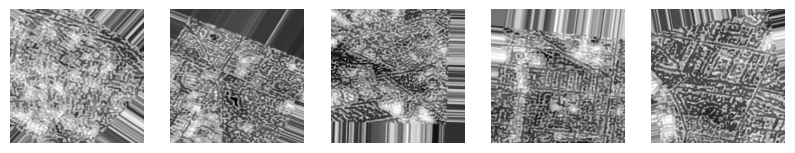

In [26]:
import matplotlib.pyplot as plt

# Load a few images from a specific class directory for testing
test_class_dir = os.path.join(augmented_dataset_path, 'urban')  # Change 'class1' to an actual class name
test_images = os.listdir(test_class_dir)

# Display a few images
plt.figure(figsize=(10, 10))
for i, img_name in enumerate(test_images[:5]):  # Display first 5 images
    img_path = os.path.join(test_class_dir, img_name)
    img = Image.open(img_path)
    plt.subplot(1, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

In [27]:
import tensorflow as tf

tf.config.run_functions_eagerly(True)

In [29]:
# Define paths for the augmented dataset
augmented_dataset_path = '/kaggle/working/Augmented_SAR_Segment'

# Set parameters
img_size = (224, 224)  # Resize images to this size
batch_size = 32

# Create ImageDataGenerator for loading and augmenting images
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    validation_split=0.2  # Use 20% of data for validation
)

# Load training and validation data
train_generator = train_datagen.flow_from_directory(
    augmented_dataset_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',  # Use 'categorical' for multi-class classification
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    augmented_dataset_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',  # Use 'categorical' for multi-class classification
    subset='validation'
)

Found 3200 images belonging to 4 classes.
Found 800 images belonging to 4 classes.


In [30]:
# Define the CNN model
model = Sequential()

# Add layers to the model
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_size[0], img_size[1], 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))  # Dropout layer to reduce overfitting
model.add(Dense(len(train_generator.class_indices), activation='softmax'))  # Output layer for multi-class classification

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_21 (Conv2D)              │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,169,476 (42.61 MB)

 Trainable params: 11,169,476 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    epochs=10,  # You can adjust this number based on your needs
    verbose=1
)

Epoch 1/10


/usr/local/lib/python3.10/site-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


100/100 ━━━━━━━━━━━━━━━━━━━━ 101s 1s/step - accuracy: 0.2616 - loss: 1.8063 - val_accuracy: 0.2237 - val_loss: 1.4485
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 213us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 3/10


/usr/local/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


100/100 ━━━━━━━━━━━━━━━━━━━━ 101s 999ms/step - accuracy: 0.3161 - loss: 1.3515 - val_accuracy: 0.2788 - val_loss: 1.6207
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 156us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 5/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 98s 979ms/step - accuracy: 0.3740 - loss: 1.3227 - val_accuracy: 0.2575 - val_loss: 1.4592
Epoch 6/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 7/10
 28/100 ━━━━━━━━━━━━━━━━━━━━ 1:07 942ms/step - accuracy: 0.3238 - loss: 1.3463

In [ ]:
# Evaluate the model on validation data
val_loss, val_accuracy = model.evaluate(validation_generator)
print(f'Validation Loss: {val_loss:.4f}')
print(f'Validation Accuracy: {val_accuracy:.4f}')

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()

plt.show()